# Time series analysis of sensor data

Load necessary libraries:

In [1]:
from influxdb import DataFrameClient
import pandas as pd
import plotly.express as px
import seaborn as sns

In [2]:
!pip3 install plotly --upgrade

Requirement already up-to-date: plotly in /usr/local/lib/python3.7/site-packages (4.9.0)


## influxdb

Connect to the influxDB instance with the sensor data

In [3]:
client = DataFrameClient('192.168.1.199', 8086, '', '', 'home_assistant')

Query for the entity required with any time filtering.

In [4]:
result = client.query('''
SELECT
    entity_id as sensor, time, value
FROM "°C" 
WHERE entity_id = 'hot_water_tube' 
    OR entity_id = 'hot_water'
    OR entity_id = 'hot_water_inlet'
    OR entity_id = 'hot_water_outlet'
AND time >= '2020-07-19 00:00:00'
AND time <= '2020-08-02' -- aga switched off
tz('Europe/London')
''')
df=result['°C']
df.reset_index(inplace=True)
df.rename(columns={"index":"timestamp", "value":"°C"},inplace=True)
df.shape

(55552, 3)

In [5]:
fig = px.line(df, x=df.timestamp.dt.to_pydatetime(), y="°C", color = "sensor", labels = {'x':'date'},title="Hot Water Cylinder")
fig.update_xaxes(rangeslider_visible=True)
fig.show()

### Calibration

In [6]:
calib = df[df.sensor.isin(['hot_water','hot_water_tube'])]
fig = px.line(calib, x=calib.timestamp.dt.to_pydatetime(), y="°C", color = "sensor", labels = {'x':'date'},title="Hot Water Temperature Calibration")
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [7]:
calib.set_index("timestamp",inplace=True)

In [8]:
resampled = calib.pivot(columns="sensor").resample("5min").mean().dropna()

In [9]:
resampled.columns

MultiIndex([('°C',      'hot_water'),
            ('°C', 'hot_water_tube')],
           names=[None, 'sensor'])

In [10]:
diff = resampled[('°C',      'hot_water_tube')] - resampled[('°C',      'hot_water')]

In [11]:
diff.describe()

count    3530.000000
mean        8.997425
std         4.804196
min       -12.896667
25%         6.052500
50%        10.296250
75%        12.283625
max        20.374000
dtype: float64

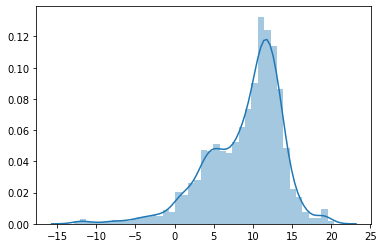

In [12]:
sns.distplot(diff)

In [13]:
diff_df = pd.DataFrame(diff)

In [14]:
diff_df.rename(columns={0:"°C"},inplace=True)
diff_df['sensor']="diff"
diff_df.head(1)

,°C,sensor
timestamp,,
2020-07-19 00:05:00+01:00,5.5825,diff


In [15]:
calib_diff = calib.append(diff_df)
calib_diff.head(1)

,sensor,°C
timestamp,,
2020-07-19 00:02:09.889453824+01:00,hot_water,34.75


In [16]:
fig = px.line(calib_diff, x=calib_diff.index.to_pydatetime(), y="°C", color = "sensor", labels = {'x':'date'},title="Hot Water Temperature Calibration")
fig.update_xaxes(rangeslider_visible=True)
fig.show()

**Average hourly temperature**

Text(0, 0.5, 'Temperature (°C)')

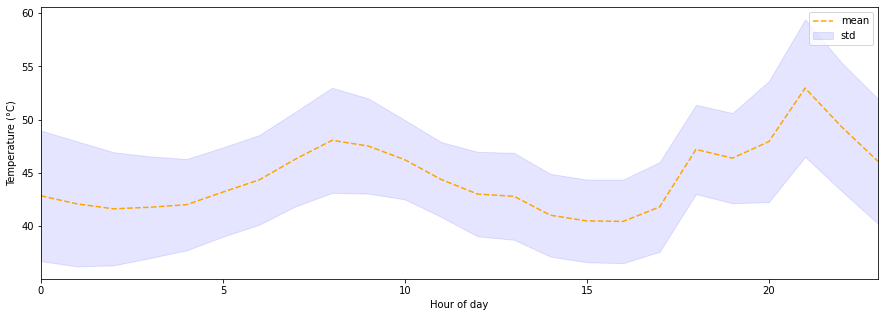

In [17]:
hourly = df[df.sensor == 'hot_water'].groupby([df[df.sensor == 'hot_water'].timestamp.dt.hour])
ax = hourly.mean().plot(figsize=[15,5],color='orange',style=['--'])
ax.fill_between(list(range(0,24)), (hourly.mean() - hourly.std()).values.transpose()[0], (hourly.mean() + hourly.std()).values.transpose()[0],color='b', alpha=.1)
ax.legend(["mean","std"])
ax.set_xlim([0,23])
ax.set_xlabel("Hour of day")
ax.set_ylabel("Temperature (°C)")